   # خوارزمية أورب

 تحميل الصور و إستيراد الموارد التي سنتحتاجها 

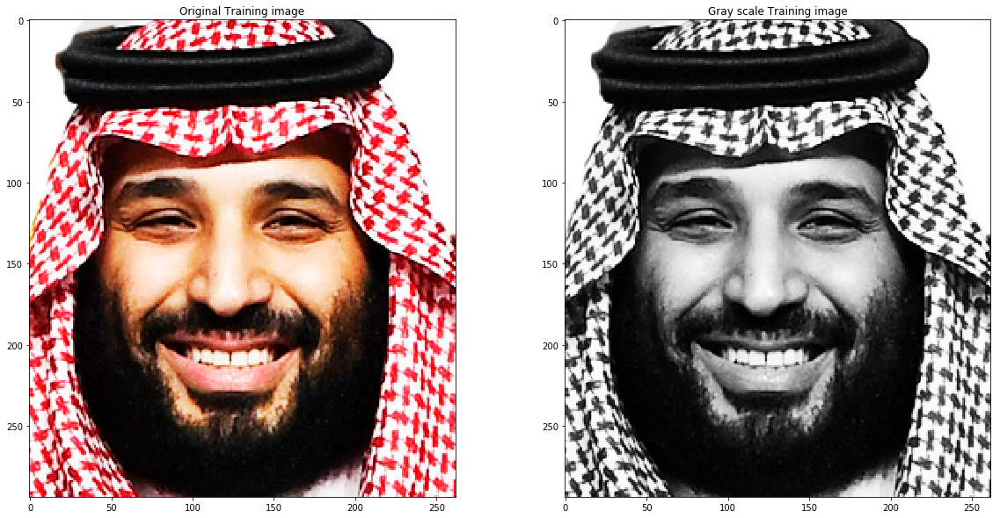

In [1]:
%matplotlib inline 

import cv2
import matplotlib.pyplot as plt

#تحديد حجم الصور المعروضة
plt.rcParams['figure.figsize'] = [20,10]

# تحميل الصورة 
image = cv2.imread('./images/face.png')

# RGB تغيير الألوان إلى  
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#  تحويل الصورة إلى الرمادي 
training_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# إظهار الصورة
plt.subplot(121)
plt.title('Original Training image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Gray scale Training image')
plt.imshow(training_gray, cmap='gray')
plt.show()

## تحديد النقاط الجوهرية

الخطوة الأولى هي تحديد النقاط الجوهرية و سنقوم بذلك عن طريقة إستخدام كلاس في مكتبة أوبن سي في تدعى أوب ، 

 ومعاملات خوارزمية أورب يتم تهيئتها بواسطة الدالة ORB_create  

`cv2.ORB_create(nfeatures = 500,
               scaleFactor = 1.2,
		       nlevels = 8,
		       edgeThreshold = 31,
		       firstLevel = 0,
		       WTA_K = 2,
		       scoreType = HARRIS_SCORE,
		       patchSize = 31,
		       fastThreshold = 20)`

المعاملات :

* **nfeatures** - *int*  

تحدد أكبر عدد نقاط جوهرية

* **scaleFactor** - *float*  

تحدد مقدار التصغير لهرم الصور لابد ان تكون القيمة أكبر من واحد

* **nlevels** - *int* 

يحدد عدد مستويات الهرم

* **edgeThreshold** - - *int*  

حجم حدود الصورة حيث لن نقوك بإكتشاف أي سمات لابد أن تكون هذه القيمة مساوية أو أكبر من الحزمة

* **firstLevel** - *int*

هنا نحدد أي مستوى من الهرم سيكوم هو المستوى الأولى وفي حالتنا هذه إخترنا صفر 

* **WTA_K** - *int* 

عدد النقاط الضوئية التي سيقوم واصف بريف المدو بمقارنتها مع بعض و إختيار النقطة الأكثر سطوع و الخيار هنا بين إثنين و ثلاثة و أربعه 

* **scoreType** - *int*

هنا لدينا خيارينا
HARRIS_SCORE
FAST_SCORE

الأولى تعني أن خوارزمية هاريس لإكتشاف الزوايا ستستخدم في تصنيف السمات أما الثانية فهي أقل دقة من هاريس لكنها أسرع 

* **patchSize** - *int* 

حجم الحزمة في واصف بريف المدور 


في العادة نهتم فقط بأول معاملين أما البقية فيمكننا تركهم كما هم


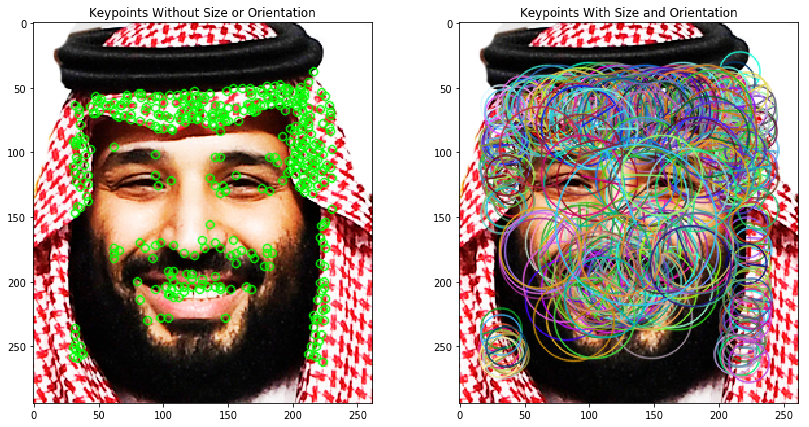


Number of keypoints Detected:  377


In [2]:
# لعمل نسخ من صورة التدريب نقوم بإستيراد التالي 
import copy 

#تحديد حجم الصور المعروض
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# تحديد معاملات خوارزمية أورب 
#سنحدد القيمة القصوى للنقاط الجوهرية
# بالإضافة إلى معامل التصغير
orb = cv2.ORB_create(500,2.0)

# إيجاد النقاط الجوهرية في صورة التدريب الرمادية
# None لإيضاح بأننا لا نستخدم قناع نكتب
keypoints, descriptor = orb.detectAndCompute(training_gray, None)

# عمل نسخة من صورة التدريب للرسم النقاط الجوهرية عليها
keyp_without_size = copy.copy(training_image)
keyp_with_size = copy.copy(training_image)

#رسم النقاط الجوهرية من دون حجم أو دوران
cv2.drawKeypoints(training_image, keypoints, keyp_without_size, color = (0,255,0))

#رسم النقاط الجوهرية مغ حجم أو دوران
cv2.drawKeypoints(training_image, keypoints, keyp_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#إظهار الصورة مع النقاط الجوهرية من دون حجم أو دوران
plt.subplot(121)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_without_size)

#إظهار الصورة مع النقاط الجوهرية مع حجم أو دوران
plt.subplot(122)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_with_size)
plt.show()

# طباعة عدد النقاط الجوهرية المكتشفة
print("\nNumber of keypoints Detected: ", len(keypoints))



كما نرى في الصورة على اليمين تظهر لنا النقاط الجوهرية بأحجام مختلفة حول مركز كل منها 

# مطابقة السمات

بعد حصولنا على واصف أورب لكل من صورة التدريب و صورة الإستعلام ، الخطوة الأخيرة هي مطابقة هذه النقاط الجوهرية و أحد الدوال المستخدمة للقيام بذلك تسمى

brute-Force

مكتبة أوبن سي في تحتوي على دالة المطابقة هذه 


`cv2.BFMatcher(normType = cv2.NORM_L2,
		 	  crossCheck = false)`

### معاملاتها

* **normType** 

 تحدد المعايير المستخدمة في ضمان جودة المطابقة الإختيار الإفتراضي هو 

`normType = cv2.NORM_L2`

 و لكن في حالة الواصفات الثنائية مثل المستخدمة في أورب معيار هامينغ هو ما ينصح بإستعمال 

`cv2.NORM_HAMMING`

* **crossCheck** - *bool* 

و هذا المعامل يقوم بالتأكد من أن النقاط الجوهرية مطابقة فعلاً ، فبعد  مطابقة النقاط الجوهرية في صورة التدريب مع النقاط الجوهرية في صورة الإستعلام ، يقوم هذا المعامل بمطابقة النقاط الجوهرية في صورة الإستعلام مع النقاط الجوهرية في صورة التدريب 


بعد تحديد معاير المطابقة سنستخدم المنهج 

`.match(descriptors_train, descriptors_query)`

لمطابقة النقاط الجوهرية في بين صورتي الإستعلام و التدريب بأستخدام واصفي أوب لكل منهما 

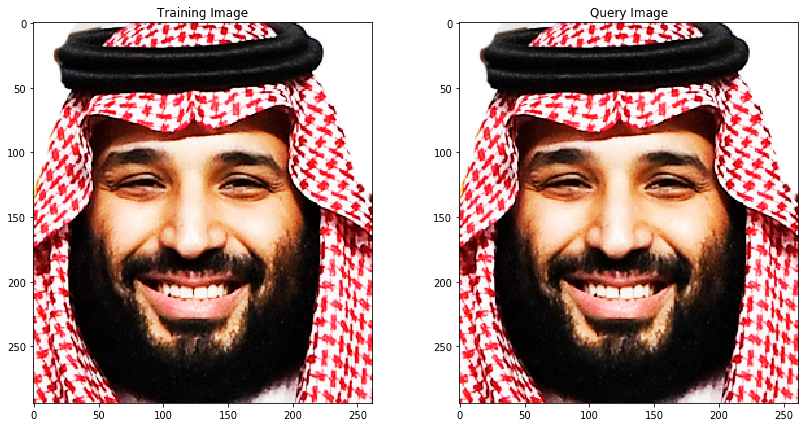

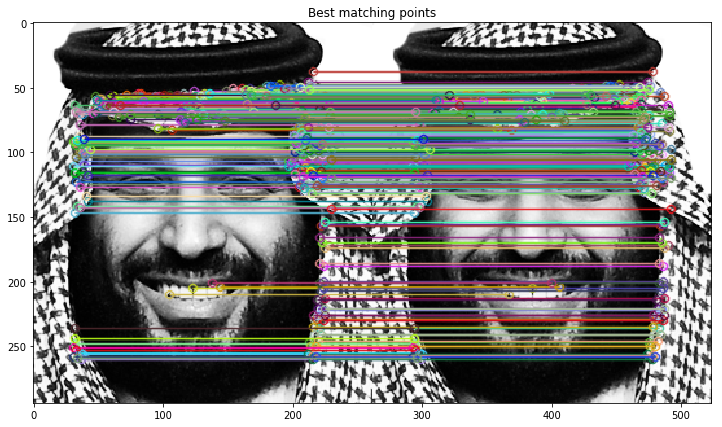

Number of Keypoints Detected In The Training Image:  747
Number of Keypoints Detected In The Training Image:  747

Number of Matching Keypoints Between The Training and Query Images:  747


In [3]:
# تحميل صورة التدريب
image1 = cv2.imread('./images/face.png')

# تحميل صورة الإستعلام
image2 = cv2.imread('./images/face.png')

#rgb تحويل صورة التدريب إلى 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

#rgb تحويل صورة الإستعلام إلى 
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#عرض الصور
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


#تحويل صورة التدريب إلى الرمادي 
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#تحويل صورة الإستعلام إلى الرمادي 
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


# تحديد معاملات خوارزمية أورب 
#سنحدد القيمة القصوى للنقاط الجوهرية
# بالإضافة إلى معامل التصغير
orb = cv2.ORB_create(1000,2.0)


# إيجاد النقاط الجوهرية في صورة التدريب و الإستعلام الرمادية
# None لإيضاح بأننا لا نستخدم قناع نكتب
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# تعيين دالة المطابقة  و تفعيل خاصية التدقيق
bf= cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# إجراء  عملية المطابقة بين واصف كل من صورة التدريب و الإستعلام
matches = bf.match(descriptors_train, descriptors_query)

# تحن مهتمين في المطابقات بين النقاط الجوهرية الأقل مسافة لذلك سنرتبهم نسبة للمسافة
matches = sorted(matches, key = lambda x : x.distance )

#توصيل النقاط الجوهرية في صورة التدريب مع مثيلاتها في صورة الإستعلام
# أفضل التطابقات سيكونون في مقدمة القائمة لأنهم الأقل مسافة 
# لذلك ستقوم برسم أول 300 تطابق
# لرسم التقاط الجوهرية  flags = 2 وسنستخدم 
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

#إظهار التطابق
plt.title('Best matching points')
plt.imshow(result)
plt.show()

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة التدريب
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة الإٍستعلام
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_query))

# طباعة عدد النقاط المتطابقة بين صورة الإستعلام و صورة التدريب
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

 يما أن صورة الإستعلام و صورة التدريب كلاهما نفس الصورة فنحن نتوقع أن تتطابق كل النقاط الجوهرية

# خصائص أورب الأساسية

:لأورب عدة خصائص رئيسية

* عدم الثأثر بالمقاس
* عدم النأثر بالدوران
* عدم التأثر بلإضائة
* عدم التأثر بالضوضاء

## عدم الثأثر بالمقاس

خوازمية أورب لا تتأثر بالمقاس و هذا يعني قدرتها على إكتشاف بغض النظر عن حجم الصورة 

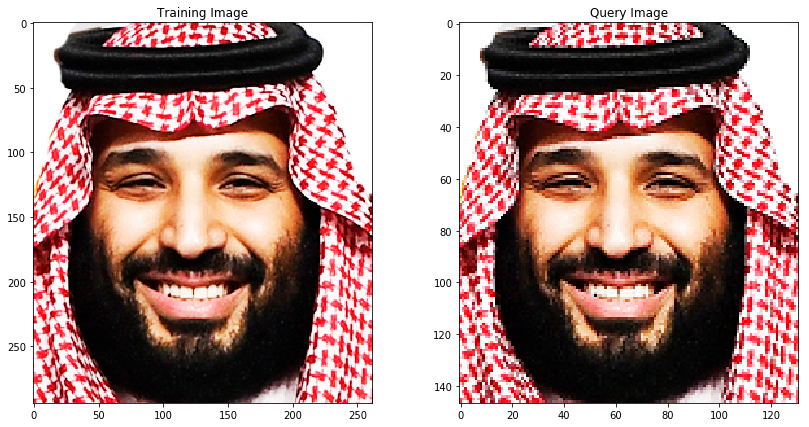

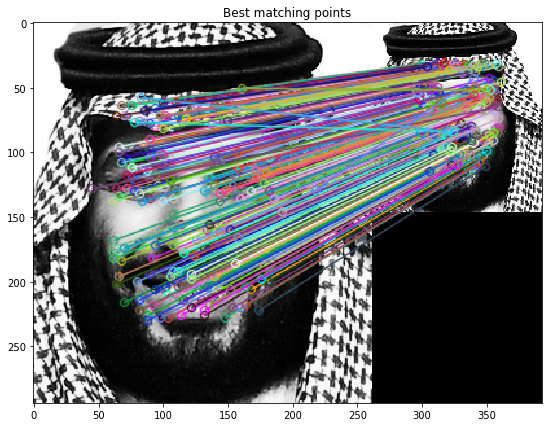

The Query Image has shape: (294, 262)
The Query Image has shape: (147, 131)
Number of Keypoints Detected In The Training Image:  747
Number of Keypoints Detected In The Training Image:  286

Number of Matching Keypoints Between The Training and Query Images:  226


In [5]:
# تحميل صورة التدريب
image1 = cv2.imread('./images/face.png')

# تحميل صورة الإستعلام
image2 = cv2.imread('./images/Face_QS.png')

#rgb تحويل صورة التدريب إلى 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

#rgb تحويل صورة الإستعلام إلى 
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#عرض الصور
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


#تحويل صورة التدريب إلى الرمادي 
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#تحويل صورة الإستعلام إلى الرمادي 
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


# تحديد معاملات خوارزمية أورب 
#سنحدد القيمة القصوى للنقاط الجوهرية
# بالإضافة إلى معامل التصغير
orb = cv2.ORB_create(1000,2.0)


# إيجاد النقاط الجوهرية في صورة التدريب و الإستعلام الرمادية
# None لإيضاح بأننا لا نستخدم قناع نكتب
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# تعيين دالة المطابقة  و تفعيل خاصية التدقيق
bf= cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# إجراء  عملية المطابقة بين واصف كل من صورة التدريب و الإستعلام
matches = bf.match(descriptors_train, descriptors_query)

# تحن مهتمين في المطابقات بين النقاط الجوهرية الأقل مسافة لذلك سنرتبهم نسبة للمسافة
matches = sorted(matches, key = lambda x : x.distance )

#توصيل النقاط الجوهرية في صورة التدريب مع مثيلاتها في صورة الإستعلام
# أفضل التطابقات سيكونون في مقدمة القائمة لأنهم الأقل مسافة 
# لذلك ستقوم برسم أول 300 تطابق
# لرسم التقاط الجوهرية  flags = 2 وسنستخدم 
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

#إظهار التطابق
plt.title('Best matching points')
plt.imshow(result)
plt.show()

#طباعة حجم صورة التدريب
print('The Query Image has shape:', training_gray.shape)

#طباعة حجم صورة الإٍستعلام
print('The Query Image has shape:', query_gray.shape)

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة التدريب
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة الإٍستعلام
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_query))

# طباعة عدد النقاط المتطابقة بين صورة الإستعلام و صورة التدريب
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

نلاحظ بأن صورة الإستعلام حجمها نصف حجم صورة التدريب و كما أن النقاط الجوهرية المتطابقة عددها 226 و هذا أقل من النقاط الـ 747 المكتشفة في صورة التدريب . لكن على الرغم من هذا تمكنت خوارزمية أورب من إكتشاف معظم النقاط الجوهرية في صورة الإستعلام 

## عدم التأثر بالدوران

و هذا يعني بأن خوارزمية أورب بوسعها إكتشاف الأجسام بغض النظر عن دوران الصورة

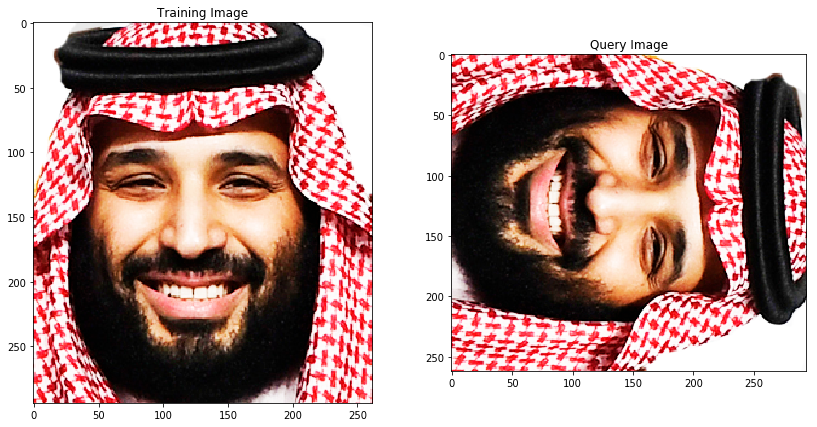

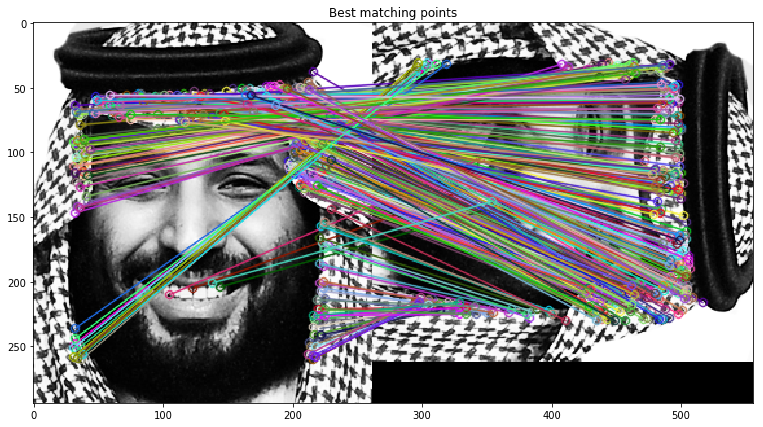

Number of Keypoints Detected In The Training Image:  747
Number of Keypoints Detected In The Training Image:  747

Number of Matching Keypoints Between The Training and Query Images:  747


In [6]:
# تحميل صورة التدريب
image1 = cv2.imread('./images/face.png')

# تحميل صورة الإستعلام
image2 = cv2.imread('./images/face_R.png')

#rgb تحويل صورة التدريب إلى 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

#rgb تحويل صورة الإستعلام إلى 
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#عرض الصور
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


#تحويل صورة التدريب إلى الرمادي 
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#تحويل صورة الإستعلام إلى الرمادي 
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


# تحديد معاملات خوارزمية أورب 
#سنحدد القيمة القصوى للنقاط الجوهرية
# بالإضافة إلى معامل التصغير
orb = cv2.ORB_create(1000,2.0)


# إيجاد النقاط الجوهرية في صورة التدريب و الإستعلام الرمادية
# None لإيضاح بأننا لا نستخدم قناع نكتب
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# تعيين دالة المطابقة  و تفعيل خاصية التدقيق
bf= cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# إجراء  عملية المطابقة بين واصف كل من صورة التدريب و الإستعلام
matches = bf.match(descriptors_train, descriptors_query)

# تحن مهتمين في المطابقات بين النقاط الجوهرية الأقل مسافة لذلك سنرتبهم نسبة للمسافة
matches = sorted(matches, key = lambda x : x.distance )

#توصيل النقاط الجوهرية في صورة التدريب مع مثيلاتها في صورة الإستعلام
# أفضل التطابقات سيكونون في مقدمة القائمة لأنهم الأقل مسافة 
# لذلك ستقوم برسم أول 300 تطابق
# لرسم التقاط الجوهرية  flags = 2 وسنستخدم 
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

#إظهار التطابق
plt.title('Best matching points')
plt.imshow(result)
plt.show()


# طباعة عدد النقاط الجوهرية المتكتشفة في صورة التدريب
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة الإٍستعلام
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_query))

# طباعة عدد النقاط المتطابقة بين صورة الإستعلام و صورة التدريب
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

نلاحظ بأنه تم إكتشاف جميع النقاط الجوهرية بغض النظر عن الدوران

## عدم التأثر بالإضائة

و هذا يعني بأن خوارزمية أورب بوسعها إكتشاف الأجسام بغض النظر عن الإخنلاف في إضائة الصورة


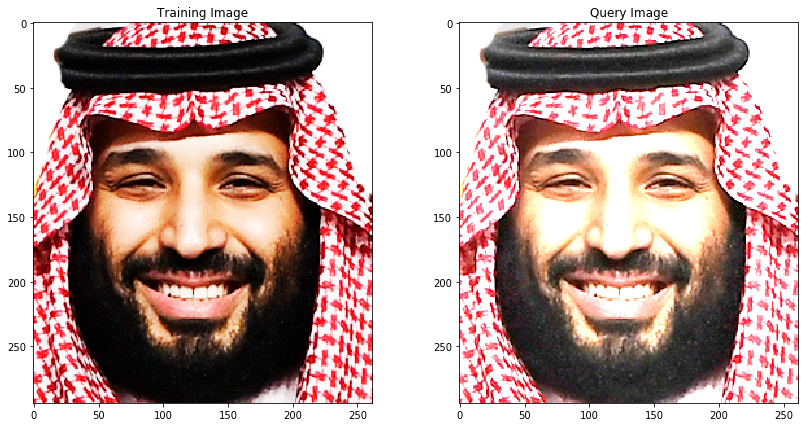

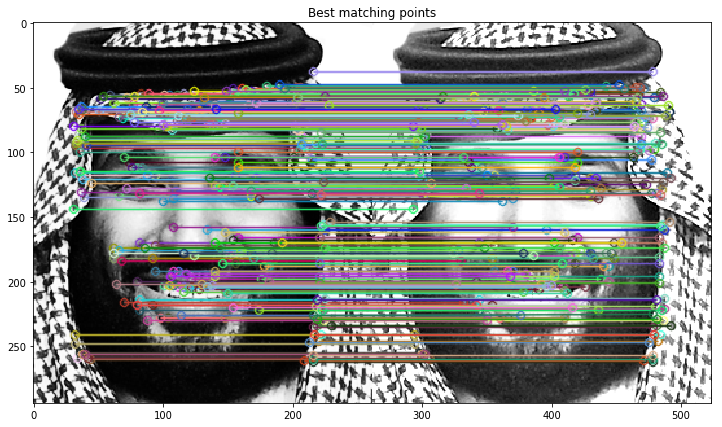

Number of Keypoints Detected In The Training Image:  747
Number of Keypoints Detected In The Training Image:  753

Number of Matching Keypoints Between The Training and Query Images:  527


In [7]:
# تحميل صورة التدريب
image1 = cv2.imread('./images/face.png')

# تحميل صورة الإستعلام
image2 = cv2.imread('./images/face_L.png')

#rgb تحويل صورة التدريب إلى 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

#rgb تحويل صورة الإستعلام إلى 
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#عرض الصور
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


#تحويل صورة التدريب إلى الرمادي 
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#تحويل صورة الإستعلام إلى الرمادي 
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


# تحديد معاملات خوارزمية أورب 
#سنحدد القيمة القصوى للنقاط الجوهرية
# بالإضافة إلى معامل التصغير
orb = cv2.ORB_create(1000,2.0)


# إيجاد النقاط الجوهرية في صورة التدريب و الإستعلام الرمادية
# None لإيضاح بأننا لا نستخدم قناع نكتب
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# تعيين دالة المطابقة  و تفعيل خاصية التدقيق
bf= cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# إجراء  عملية المطابقة بين واصف كل من صورة التدريب و الإستعلام
matches = bf.match(descriptors_train, descriptors_query)

# تحن مهتمين في المطابقات بين النقاط الجوهرية الأقل مسافة لذلك سنرتبهم نسبة للمسافة
matches = sorted(matches, key = lambda x : x.distance )

#توصيل النقاط الجوهرية في صورة التدريب مع مثيلاتها في صورة الإستعلام
# أفضل التطابقات سيكونون في مقدمة القائمة لأنهم الأقل مسافة 
# لذلك ستقوم برسم أول 300 تطابق
# لرسم التقاط الجوهرية  flags = 2 وسنستخدم 
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

#إظهار التطابق
plt.title('Best matching points')
plt.imshow(result)
plt.show()


# طباعة عدد النقاط الجوهرية المتكتشفة في صورة التدريب
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة الإٍستعلام
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_query))

# طباعة عدد النقاط المتطابقة بين صورة الإستعلام و صورة التدريب
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

  و كالسابق نجد بأن خوارزمية أورب إكتشفت  قرابة 69% من النقاط الجوهرية
  
  ## عدم التأثر بالضوضاء

و هذا يعني بأن خوارزمية أورب بوسعها إكتشاف الأجسام حتى مع وجود بعض الضوضاء في الصورة

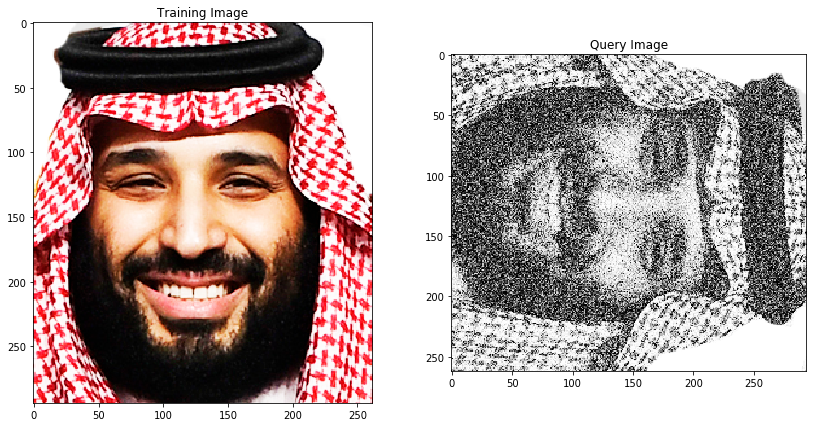

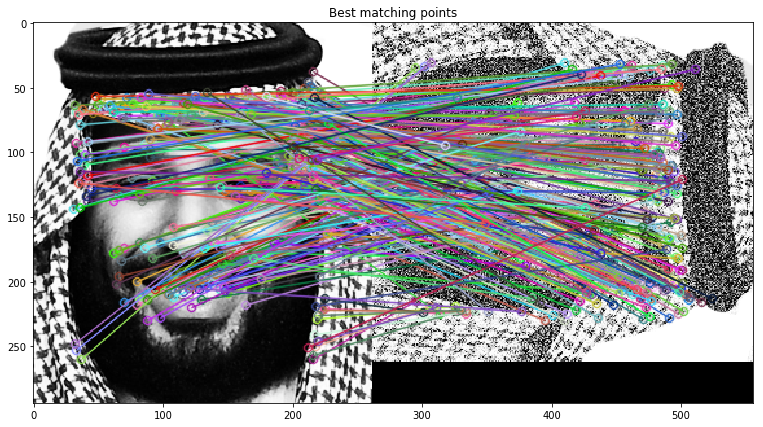

Number of Keypoints Detected In The Training Image:  747
Number of Keypoints Detected In The Training Image:  754

Number of Matching Keypoints Between The Training and Query Images:  292


In [8]:

# تحميل صورة التدريب
image1 = cv2.imread('./images/face.png')

# تحميل صورة الإستعلام
image2 = cv2.imread('./images/face_Noise.png')

#rgb تحويل صورة التدريب إلى 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

#rgb تحويل صورة الإستعلام إلى 
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#عرض الصور
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


#تحويل صورة التدريب إلى الرمادي 
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#تحويل صورة الإستعلام إلى الرمادي 
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


# تحديد معاملات خوارزمية أورب 
#سنحدد القيمة القصوى للنقاط الجوهرية
# بالإضافة إلى معامل التصغير
orb = cv2.ORB_create(1000,2.0)


# إيجاد النقاط الجوهرية في صورة التدريب و الإستعلام الرمادية
# None لإيضاح بأننا لا نستخدم قناع نكتب
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# تعيين دالة المطابقة  و تفعيل خاصية التدقيق
bf= cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# إجراء  عملية المطابقة بين واصف كل من صورة التدريب و الإستعلام
matches = bf.match(descriptors_train, descriptors_query)

# تحن مهتمين في المطابقات بين النقاط الجوهرية الأقل مسافة لذلك سنرتبهم نسبة للمسافة
matches = sorted(matches, key = lambda x : x.distance )

#توصيل النقاط الجوهرية في صورة التدريب مع مثيلاتها في صورة الإستعلام
# أفضل التطابقات سيكونون في مقدمة القائمة لأنهم الأقل مسافة 
# لذلك ستقوم برسم أول 300 تطابق
# لرسم التقاط الجوهرية  flags = 2 وسنستخدم 
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

#إظهار التطابق
plt.title('Best matching points')
plt.imshow(result)
plt.show()


# طباعة عدد النقاط الجوهرية المتكتشفة في صورة التدريب
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة الإٍستعلام
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_query))

# طباعة عدد النقاط المتطابقة بين صورة الإستعلام و صورة التدريب
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

و كما نرى فقد تمكنت خوارزمية أورب من إكتشاف عدد قريب من النقاط الجوهرية في الصورة على الرغم من وجود ضوضاء عالية في صورة الإستعلام كما أن خوارزمية أورب تمكنت من مطابقة 40% من النقاط الجوهرية و لزيادة دقة الخوارزمية فبمقدورنا تغيير كل من معاملي القيمة القصوى للنقاط الجوهرية و معامل التكبير 

# إكتشاف الأجساك

الأن سنقوم بإستخدام خوارزمية أورب لإكتشاف وجه في صورة أخرى

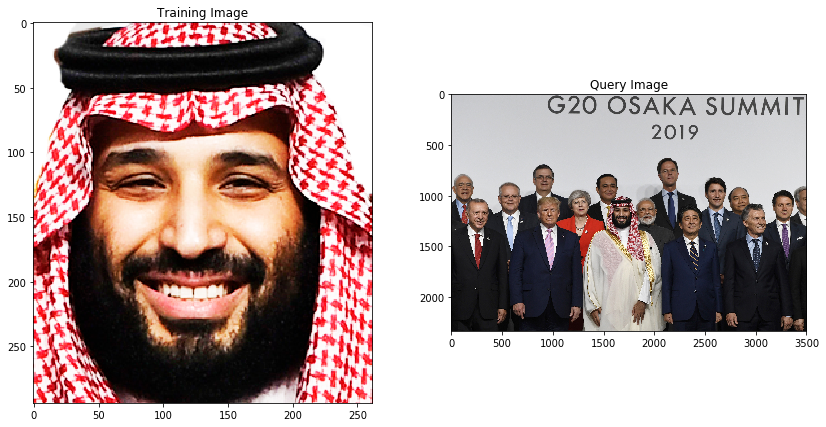

In [9]:
# تحميل صورة التدريب
image1 = cv2.imread('./images/face.png')

# تحميل صورة الإستعلام
image2 = cv2.imread('./images/g20.jpg')

#rgb تحويل صورة التدريب إلى 
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

#rgb تحويل صورة الإستعلام إلى 
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#عرض الصور
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()


هنا نرى بأن صورة التدريب تحتوي على وجه بينما صورة الإستعلام تحتوي على عدة أوجه

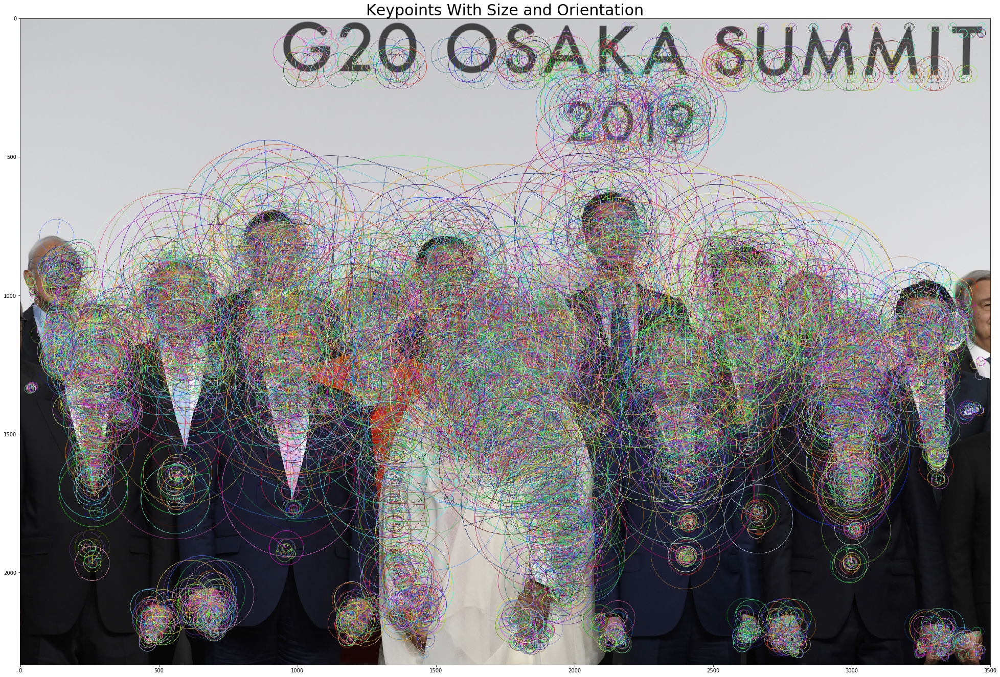

Number of Keypoints Detected In The Training Image:  23058


In [10]:
#  تحديد حجم الصورة المطبوعه
plt.rcParams['figure.figsize'] = [34.0, 34.0]

#تحويل صورة التدريب إلى الرمادي 
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

#تحويل صورة الإستعلام إلى الرمادي 
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)


# تحديد معاملات خوارزمية أورب 
#سنحدد القيمة القصوى للنقاط الجوهرية
# بالإضافة إلى معامل التصغير
orb = cv2.ORB_create(25000,2.0)


# إيجاد النقاط الجوهرية في صورة التدريب و الإستعلام الرمادية
# None لإيضاح بأننا لا نستخدم قناع نكتب
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# صناعة نسخ من صورة الإستعلام للرسم فوقها
query_img_keyp = copy.copy(query_image)

# رسم النقاط الجوهرية مع توضيح حجم و دوران النقاط الجوهرية
cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, flags = cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

#إظهار صورة الإستعلام مع النقاط الجوهرية
plt.title('Keypoints With Size and Orientation', fontsize = 30)
plt.imshow(query_img_keyp)
plt.show()

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة التدريب
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_query))

بإمكاننا رؤية بأن صورة الإستعلام تحتوي على الكثير من النقاط الجوهرية ، الأن و قد حصلنا على صورة النقاط الجوهرية و وواصف أورب لكل من الصورتين حاو وقت إجراء مطابقة عليهم

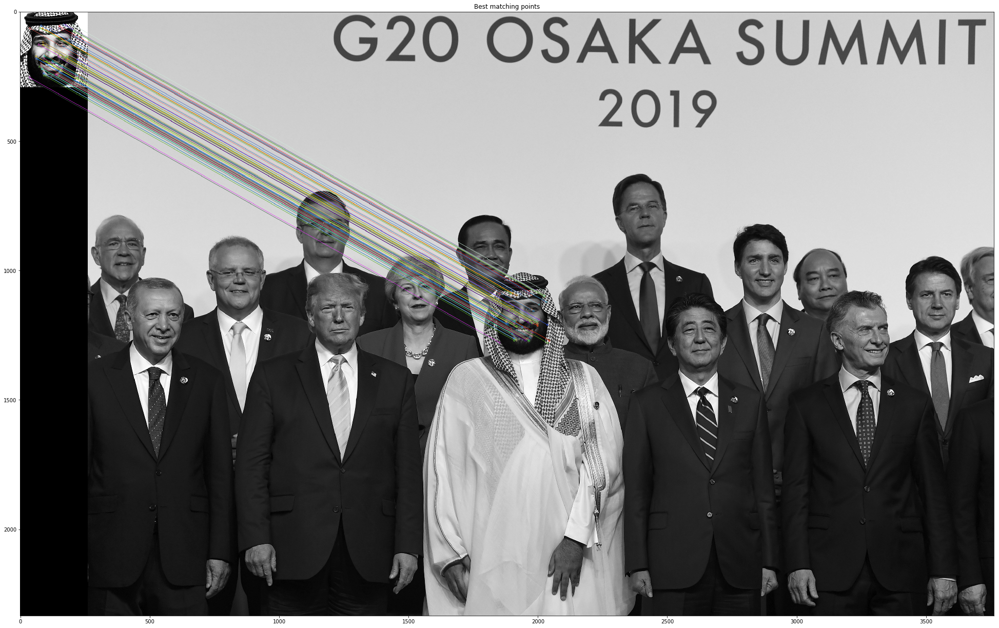

Number of Keypoints Detected In The Training Image:  1384
Number of Keypoints Detected In The Training Image:  23058

Number of Matching Keypoints Between The Training and Query Images:  1118


In [11]:

# تعيين دالة المطابقة  و تفعيل خاصية التدقيق
bf= cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# إجراء  عملية المطابقة بين واصف كل من صورة التدريب و الإستعلام
matches = bf.match(descriptors_train, descriptors_query)

# تحن مهتمين في المطابقات بين النقاط الجوهرية الأقل مسافة لذلك سنرتبهم نسبة للمسافة
matches = sorted(matches, key = lambda x : x.distance )

#توصيل النقاط الجوهرية في صورة التدريب مع مثيلاتها في صورة الإستعلام
# أفضل التطابقات سيكونون في مقدمة القائمة لأنهم الأقل مسافة 
# لذلك ستقوم برسم أول 85 تطابق
# لرسم التقاط الجوهرية  flags = 2 وسنستخدم 
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:85], query_gray, flags = 2)

#إظهار التطابق
plt.title('Best matching points')
plt.imshow(result)
plt.show()


# طباعة عدد النقاط الجوهرية المتكتشفة في صورة التدريب
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# طباعة عدد النقاط الجوهرية المتكتشفة في صورة الإٍستعلام
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_query))

# طباعة عدد النقاط المتطابقة بين صورة الإستعلام و صورة التدريب
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

و نلاحظ بأنه قد تم إكتشاف الوجه بنجاح

و إذا ما رغبنا بتجريب الخوارزمية على أوجه أخرى فقد أرفقت عدة أوجه في مجلد الصور و هي 

face2 , face3 , face4 , face5
